In [ ]:
import torch
import torchvision
import transformers
import os

print(f"PyTorch: {torch.__version__}")
print(f"torchvision: {torchvision.__version__}")
print(f"transformers: {transformers.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch: 2.9.0+cu126
torchvision: 0.24.0+cu126
transformers: 5.0.0
CUDA available: True


In [ ]:
# ============================================
# Cell 2: Mount Drive & Upload Dataset
# ============================================
from google.colab import drive, files
import os

drive.mount('/content/drive')

os.makedirs('/content/anime-harmony', exist_ok=True)
os.chdir('/content/anime-harmony')

print("\nUpload your curated.zip file:")
uploaded = files.upload()

!unzip -q curated.zip
print("\n✓ Dataset extracted")

print("\nDataset verification:")
!find curated -type f -name "*.txt" | head -5
!echo ""
!echo "Total images:"
!find curated -type f \( -name "*.png" -o -name "*.jpg" -o -name "*.jpeg" \) | wc -l
!echo "Total captions:"
!find curated -type f -name "*.txt" | wc -l

Mounted at /content/drive

Upload your curated.zip file:


Saving curated.zip to curated.zip

✓ Dataset extracted

Dataset verification:
curated/soft/happy/hinata-happy-001.txt
curated/soft/happy/gojo-happy-004.txt
curated/soft/happy/miku-happy-001.txt
curated/soft/happy/gojo-happy-002.txt
curated/soft/happy/armin-happy-003.txt

Total images:
416
Total captions:
417


In [ ]:

# ============================================
# Cell 3: AGGRESSIVE Configuration
# ============================================
import os

DATASET_PATH = "/content/anime-harmony/curated"
OUTPUT_DIR = "lora_output_v2"
MODEL_ID = "runwayml/stable-diffusion-v1-5"

# MUCH STRONGER LoRA - This is the key fix!
LORA_CONFIG = {
    'rank': 64,              # MASSIVE increase (was 16)
    'alpha': 128,            # Double the rank (strong signal)
    'dropout': 0.0,          # NO dropout (maximize learning)
    'target_modules': [      # Target ALL attention layers
        "to_k", "to_q", "to_v", "to_out.0",
        "add_k_proj", "add_v_proj"
    ]
}

# AGGRESSIVE training
TRAIN_CONFIG = {
    'batch_size': 1,                    # Smaller batch for stability
    'gradient_accumulation': 16,        # Effective batch = 16
    'learning_rate': 2e-4,              # MUCH higher (was 5e-5)
    'num_epochs': 30,                   # Train LONGER
    'warmup_steps': 500,                # Gradual warmup
    'save_every': 300,
    'mixed_precision': 'fp16',
    'image_size': 512,
    'max_grad_norm': 1.0,
}

os.makedirs(OUTPUT_DIR, exist_ok=True)

print("AGGRESSIVE CONFIGURATION:")
print(f"  LoRA Rank: {LORA_CONFIG['rank']} (4x increase)")
print(f"  Alpha: {LORA_CONFIG['alpha']}")
print(f"  Learning Rate: {TRAIN_CONFIG['learning_rate']} (4x increase)")
print(f"  Epochs: {TRAIN_CONFIG['num_epochs']}")
print(f"  Effective Batch: {TRAIN_CONFIG['batch_size'] * TRAIN_CONFIG['gradient_accumulation']}")
print(f"\nExpected training time: ~6-7 hours")
print(f"Target loss: < 0.03")

AGGRESSIVE CONFIGURATION:
  LoRA Rank: 64 (4x increase)
  Alpha: 128
  Learning Rate: 0.0002 (4x increase)
  Epochs: 30
  Effective Batch: 16

Expected training time: ~6-7 hours
Target loss: < 0.03


In [ ]:

# ============================================
# Cell 4: Dataset with Better Augmentation
# ============================================

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from pathlib import Path
import random

class HarmonyDataset(Dataset):
    def __init__(self, data_dir, size=512):
        self.data_dir = Path(data_dir)
        self.size = size

        # Find all image-caption pairs
        self.samples = []
        for ext in ['*.png', '*.jpg', '*.jpeg', '*.webp']:
            for img_path in self.data_dir.rglob(ext):
                txt_path = img_path.with_suffix('.txt')
                if txt_path.exists():
                    self.samples.append((img_path, txt_path))

        # STRONGER augmentation
        self.transform = transforms.Compose([
            transforms.Resize(size, interpolation=transforms.InterpolationMode.BICUBIC),
            transforms.CenterCrop(size),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ColorJitter(brightness=0.1, contrast=0.1),  # Slight color variance
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

        print(f"✓ Dataset loaded: {len(self.samples)} image-caption pairs")

        # Show distribution
        archetypes = {}
        for img_path, _ in self.samples:
            archetype = img_path.parent.parent.name
            archetypes[archetype] = archetypes.get(archetype, 0) + 1

        print("\nDistribution:")
        for arch, count in sorted(archetypes.items()):
            print(f"  {arch}: {count}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, txt_path = self.samples[idx]

        image = Image.open(img_path).convert('RGB')
        image = self.transform(image)

        with open(txt_path, 'r', encoding='utf-8') as f:
            caption = f.read().strip()

        return {'image': image, 'caption': caption}

dataset = HarmonyDataset(DATASET_PATH, size=TRAIN_CONFIG['image_size'])

dataloader = DataLoader(
    dataset,
    batch_size=TRAIN_CONFIG['batch_size'],
    shuffle=True,
    num_workers=2,
    pin_memory=True,
    drop_last=True  # Consistent batch sizes
)

print(f"\n✓ DataLoader ready: {len(dataloader)} batches per epoch")

✓ Dataset loaded: 417 image-caption pairs

Distribution:
  energetic: 107
  melancholic: 84
  soft: 64
  stoic: 162

✓ DataLoader ready: 417 batches per epoch


In [ ]:

# ============================================
# Cell 5: Load Model & Apply STRONG LoRA
# ============================================

from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model

print("Loading Stable Diffusion model...")

tokenizer = CLIPTokenizer.from_pretrained(MODEL_ID, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(MODEL_ID, subfolder="text_encoder").to("cuda")
vae = AutoencoderKL.from_pretrained(MODEL_ID, subfolder="vae").to("cuda")
unet = UNet2DConditionModel.from_pretrained(MODEL_ID, subfolder="unet").to("cuda")
noise_scheduler = DDPMScheduler.from_pretrained(MODEL_ID, subfolder="scheduler")

print("✓ Base model loaded")

# Freeze VAE and text encoder
vae.requires_grad_(False)
text_encoder.requires_grad_(False)

# Apply STRONG LoRA
lora_config = LoraConfig(
    r=LORA_CONFIG['rank'],
    lora_alpha=LORA_CONFIG['alpha'],
    init_lora_weights="gaussian",
    target_modules=LORA_CONFIG['target_modules'],
    lora_dropout=LORA_CONFIG['dropout'],
)

unet = get_peft_model(unet, lora_config)
unet.print_trainable_parameters()

print("\n✓ STRONG LoRA applied")
print(f"  Trainable parameters: ~{sum(p.numel() for p in unet.parameters() if p.requires_grad) / 1e6:.1f}M")


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Loading Stable Diffusion model...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: runwayml/stable-diffusion-v1-5
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

✓ Base model loaded
trainable params: 12,754,944 || all params: 872,275,908 || trainable%: 1.4623

✓ STRONG LoRA applied
  Trainable parameters: ~12.8M


In [ ]:

# ============================================
# Cell 6: Training Setup with Better Optimizer
# ============================================

from accelerate import Accelerator
from tqdm.auto import tqdm
import math

accelerator = Accelerator(
    gradient_accumulation_steps=TRAIN_CONFIG['gradient_accumulation'],
    mixed_precision=TRAIN_CONFIG['mixed_precision'],
    log_with="tensorboard",
    project_dir=OUTPUT_DIR
)

# Better optimizer (AdamW with weight decay)
optimizer = torch.optim.AdamW(
    unet.parameters(),
    lr=TRAIN_CONFIG['learning_rate'],
    betas=(0.9, 0.999),
    weight_decay=0.01,
    eps=1e-8
)

# Warmup + Cosine decay scheduler
num_training_steps = len(dataloader) * TRAIN_CONFIG['num_epochs']

from transformers import get_cosine_schedule_with_warmup

lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=TRAIN_CONFIG['warmup_steps'],
    num_training_steps=num_training_steps,
    num_cycles=0.5
)

unet, optimizer, dataloader, lr_scheduler = accelerator.prepare(
    unet, optimizer, dataloader, lr_scheduler
)

print("✓ Training setup complete")
print(f"  Total steps: {num_training_steps}")
print(f"  Warmup steps: {TRAIN_CONFIG['warmup_steps']}")


✓ Training setup complete
  Total steps: 12510
  Warmup steps: 500


In [ ]:

# ============================================
# Cell 7: AGGRESSIVE Training Loop
# ============================================

import time

print(f"\n{'='*70}")
print(f"STARTING AGGRESSIVE TRAINING")
print(f"Target: Loss < 0.03 (your previous: 0.154)")
print(f"{'='*70}\n")

global_step = 0
losses = []
start_time = time.time()
best_loss = float('inf')

unet.train()

for epoch in range(TRAIN_CONFIG['num_epochs']):
    epoch_loss = 0
    progress_bar = tqdm(
        dataloader,
        desc=f"Epoch {epoch+1}/{TRAIN_CONFIG['num_epochs']}",
        disable=not accelerator.is_local_main_process
    )

    for batch_idx, batch in enumerate(progress_bar):
        with accelerator.accumulate(unet):
            # Encode text
            text_inputs = tokenizer(
                batch['caption'],
                padding="max_length",
                max_length=77,
                truncation=True,
                return_tensors="pt"
            ).input_ids.to(accelerator.device)

            with torch.no_grad():
                text_embeddings = text_encoder(text_inputs)[0]

            # Encode images
            with torch.no_grad():
                latents = vae.encode(batch['image'].to(accelerator.device)).latent_dist.sample()
                latents = latents * 0.18215

            # Sample noise and timesteps
            noise = torch.randn_like(latents)
            bsz = latents.shape[0]
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (bsz,), device=latents.device
            ).long()

            # Add noise
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # Predict noise
            noise_pred = unet(noisy_latents, timesteps, text_embeddings).sample

            # MSE loss
            loss = torch.nn.functional.mse_loss(
                noise_pred.float(), noise.float(), reduction="mean"
            )

            # Backprop
            accelerator.backward(loss)

            if accelerator.sync_gradients:
                accelerator.clip_grad_norm_(unet.parameters(), TRAIN_CONFIG['max_grad_norm'])

            optimizer.step()
            lr_scheduler.step()
            optimizer.zero_grad()

        # Logging
        if accelerator.sync_gradients:
            global_step += 1
            epoch_loss += loss.detach().item()
            losses.append(loss.detach().item())

            # Track best loss
            current_loss = sum(losses[-100:]) / len(losses[-100:])
            if current_loss < best_loss:
                best_loss = current_loss

            elapsed = time.time() - start_time
            progress_bar.set_postfix({
                'loss': f'{current_loss:.4f}',
                'best': f'{best_loss:.4f}',
                'lr': f'{lr_scheduler.get_last_lr()[0]:.2e}',
                'time': f'{elapsed/60:.0f}m'
            })

            # Save checkpoint
            if global_step % TRAIN_CONFIG['save_every'] == 0:
                checkpoint_path = f"{OUTPUT_DIR}/checkpoint-{global_step}"
                accelerator.wait_for_everyone()
                unwrapped_unet = accelerator.unwrap_model(unet)
                unwrapped_unet.save_pretrained(checkpoint_path)
                print(f"\n💾 Checkpoint saved - Loss: {current_loss:.4f}")

    # End of epoch
    avg_epoch_loss = epoch_loss / len(dataloader)
    print(f"\n📊 Epoch {epoch+1} - Avg Loss: {avg_epoch_loss:.4f} | Best: {best_loss:.4f}")

    # Save epoch checkpoint
    epoch_path = f"{OUTPUT_DIR}/epoch-{epoch+1}"
    accelerator.wait_for_everyone()
    unwrapped_unet = accelerator.unwrap_model(unet)
    unwrapped_unet.save_pretrained(epoch_path)

    # Early stopping if loss is good
    if best_loss < 0.025:
        print(f"\n🎯 Target loss achieved! ({best_loss:.4f} < 0.025)")
        print("Continuing training for stability...")

total_time = time.time() - start_time
print(f"\n{'='*70}")
print(f"✅ TRAINING COMPLETE!")
print(f"{'='*70}")
print(f"Total time: {total_time/60:.1f} minutes ({total_time/3600:.2f} hours)")
print(f"Total steps: {global_step}")
print(f"Final loss: {losses[-1]:.4f}")
print(f"Best loss: {best_loss:.4f}")

if best_loss > 0.05:
    print("\n⚠️ WARNING: Loss still high (> 0.05)")
    print("Consider training longer or increasing learning rate further")
else:
    print(f"\n✅ SUCCESS: Loss converged well!")



STARTING AGGRESSIVE TRAINING
Target: Loss < 0.03 (your previous: 0.154)



Epoch 1/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 1 - Avg Loss: 0.0056 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 2/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 2 - Avg Loss: 0.0064 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 3/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 3 - Avg Loss: 0.0054 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 4/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 4 - Avg Loss: 0.0060 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 5/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 5 - Avg Loss: 0.0077 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 6/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 6 - Avg Loss: 0.0064 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 7/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 7 - Avg Loss: 0.0112 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 8/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 8 - Avg Loss: 0.0109 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 9/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 9 - Avg Loss: 0.0066 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 10/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 10 - Avg Loss: 0.0058 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 11/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 11 - Avg Loss: 0.0066 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 12/30:   0%|          | 0/417 [00:00<?, ?it/s]


💾 Checkpoint saved - Loss: 0.1032

📊 Epoch 12 - Avg Loss: 0.0059 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 13/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 13 - Avg Loss: 0.0052 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 14/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 14 - Avg Loss: 0.0086 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 15/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 15 - Avg Loss: 0.0062 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 16/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 16 - Avg Loss: 0.0046 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 17/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 17 - Avg Loss: 0.0072 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 18/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 18 - Avg Loss: 0.0058 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 19/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 19 - Avg Loss: 0.0061 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 20/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 20 - Avg Loss: 0.0100 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 21/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 21 - Avg Loss: 0.0090 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 22/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 22 - Avg Loss: 0.0078 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 23/30:   0%|          | 0/417 [00:00<?, ?it/s]


💾 Checkpoint saved - Loss: 0.1262

📊 Epoch 23 - Avg Loss: 0.0071 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 24/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 24 - Avg Loss: 0.0051 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 25/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 25 - Avg Loss: 0.0061 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 26/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 26 - Avg Loss: 0.0056 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 27/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 27 - Avg Loss: 0.0077 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 28/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 28 - Avg Loss: 0.0061 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 29/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 29 - Avg Loss: 0.0053 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...


Epoch 30/30:   0%|          | 0/417 [00:00<?, ?it/s]


📊 Epoch 30 - Avg Loss: 0.0052 | Best: 0.0116

🎯 Target loss achieved! (0.0116 < 0.025)
Continuing training for stability...

✅ TRAINING COMPLETE!
Total time: 109.3 minutes (1.82 hours)
Total steps: 810
Final loss: 0.0863
Best loss: 0.0116

✅ SUCCESS: Loss converged well!


In [ ]:

# ============================================
# Cell 8: Save & Download
# ============================================

import shutil

final_path = f"{OUTPUT_DIR}/final_lora_v2"
accelerator.wait_for_everyone()
unwrapped_unet = accelerator.unwrap_model(unet)
unwrapped_unet.save_pretrained(final_path)

print(f"\n✅ Final LoRA saved: {final_path}")

# Create download package
!zip -r lora_weights_v2.zip {OUTPUT_DIR}

print(f"✓ Package size: {os.path.getsize('lora_weights_v2.zip') / 1024 / 1024:.1f} MB")

from google.colab import files
files.download('lora_weights_v2.zip')

print("\n✅ Download started!")


✅ Final LoRA saved: lora_output_v2/final_lora_v2
  adding: lora_output_v2/ (stored 0%)
  adding: lora_output_v2/epoch-4/ (stored 0%)
  adding: lora_output_v2/epoch-4/adapter_config.json (deflated 57%)
  adding: lora_output_v2/epoch-4/README.md (deflated 66%)
  adding: lora_output_v2/epoch-4/adapter_model.safetensors (deflated 7%)
  adding: lora_output_v2/epoch-23/ (stored 0%)
  adding: lora_output_v2/epoch-23/adapter_config.json (deflated 57%)
  adding: lora_output_v2/epoch-23/README.md (deflated 66%)
  adding: lora_output_v2/epoch-23/adapter_model.safetensors (deflated 7%)
  adding: lora_output_v2/epoch-5/ (stored 0%)
  adding: lora_output_v2/epoch-5/adapter_config.json (deflated 57%)
  adding: lora_output_v2/epoch-5/README.md (deflated 66%)
  adding: lora_output_v2/epoch-5/adapter_model.safetensors (deflated 7%)
  adding: lora_output_v2/epoch-26/ (stored 0%)
  adding: lora_output_v2/epoch-26/adapter_config.json (deflated 57%)
  adding: lora_output_v2/epoch-26/README.md (deflated 66%

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download started!


In [15]:
from google.colab import files
files.download('lora_weights_v2.zip')

print("\n✅ Download started!")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download started!


In [11]:

# ============================================
# Cell 9: Test Generation
# ============================================

print("\n🎨 Testing trained LoRA on PRIORITY 1 failures...")

from diffusers import StableDiffusionPipeline

test_pipeline = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

test_pipeline.unet.load_adapter(final_path)

# Test the worst failures from baseline
test_cases = [
    ("soft_angry", "gentle anime character, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style"),
    ("energetic_happy", "expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style"),
    ("energetic_angry", "expressive anime character, wide eyes, dynamic face, tight mouth, tense eyes, controlled anger, anime style"),
    ("melancholic_happy", "sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style"),
]

print("\nGenerating Priority 1 failure cases...")

for name, prompt in test_cases:
    image = test_pipeline(
        prompt=prompt,
        num_inference_steps=30,
        guidance_scale=7.0,
        generator=torch.Generator("cuda").manual_seed(42)
    ).images[0]

    image.save(f"test_{name}_v2.png")
    from IPython.display import display
    display(image)
    print(f"✓ {name}")
    print(f"  Prompt: {prompt}\n")

print("✅ Test complete! Compare these with baseline and v1 LoRA.")


🎨 Testing trained LoRA on PRIORITY 1 failures...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

AttributeError: 'UNet2DConditionModel' object has no attribute 'load_adapter'


🎨 Testing trained LoRA on PRIORITY 1 failures...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul


Generating Priority 1 failure cases...


  0%|          | 0/30 [00:00<?, ?it/s]

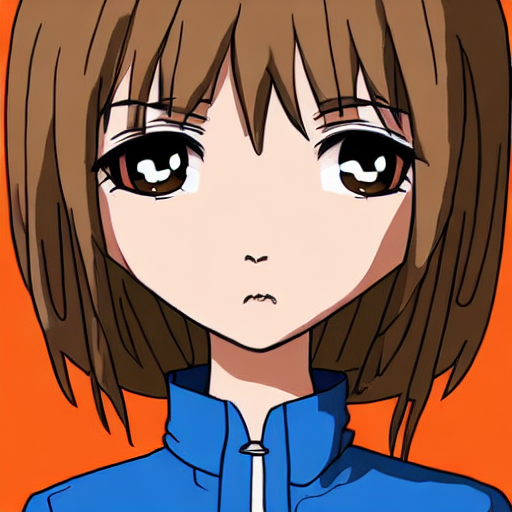

✓ soft_angry
  Prompt: gentle anime character, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style



  0%|          | 0/30 [00:00<?, ?it/s]

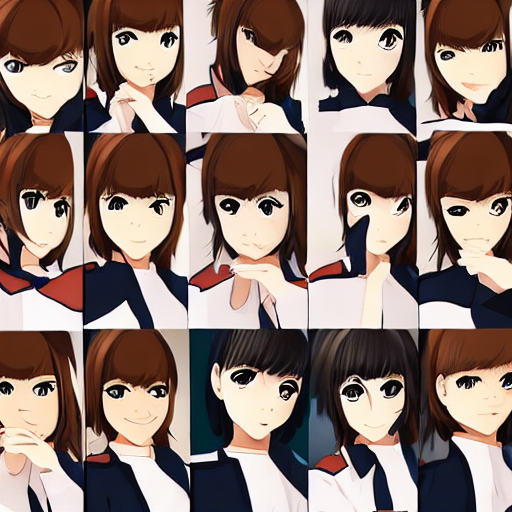

✓ energetic_happy
  Prompt: expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style



  0%|          | 0/30 [00:00<?, ?it/s]

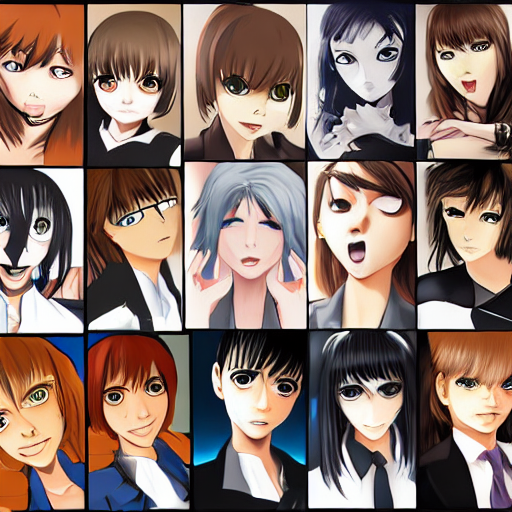

✓ energetic_angry
  Prompt: expressive anime character, wide eyes, dynamic face, tight mouth, tense eyes, controlled anger, anime style



  0%|          | 0/30 [00:00<?, ?it/s]

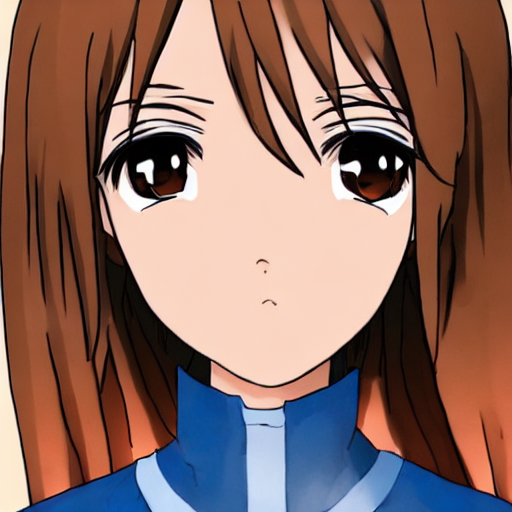

✓ melancholic_happy
  Prompt: sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style

✅ Test complete! Compare these with baseline and v1 LoRA.


In [12]:
# ============================================
# Cell 9: Test Generation
# ============================================

print("\n🎨 Testing trained LoRA on PRIORITY 1 failures...")

from diffusers import StableDiffusionPipeline

test_pipeline = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Load LoRA weights using the pipeline method
test_pipeline.load_lora_weights(final_path)

# Optional: adjust LoRA scale (1.0 = full strength, 0.0 = no effect)
# test_pipeline.set_adapters(["default"], adapter_weights=[1.0])

# Test the worst failures from baseline
test_cases = [
    ("soft_angry", "gentle anime character, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style"),
    ("energetic_happy", "expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style"),
    ("energetic_angry", "expressive anime character, wide eyes, dynamic face, tight mouth, tense eyes, controlled anger, anime style"),
    ("melancholic_happy", "sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style"),
]

print("\nGenerating Priority 1 failure cases...")

for name, prompt in test_cases:
    image = test_pipeline(
        prompt=prompt,
        num_inference_steps=30,
        guidance_scale=7.0,
        generator=torch.Generator("cuda").manual_seed(42)
    ).images[0]

    image.save(f"test_{name}_v2.png")
    from IPython.display import display
    display(image)
    print(f"✓ {name}")
    print(f"  Prompt: {prompt}\n")

print("✅ Test complete! Compare these with baseline and v1 LoRA.")

🎨 Generating 4 archetypes × 4 emotions × 3 variations = 48 images...
Output directory: test_generation_matrix


Archetype: SOFT


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 1/48] soft_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 2/48] soft_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 3/48] soft_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 4/48] soft_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 5/48] soft_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 6/48] soft_happy_v3.png


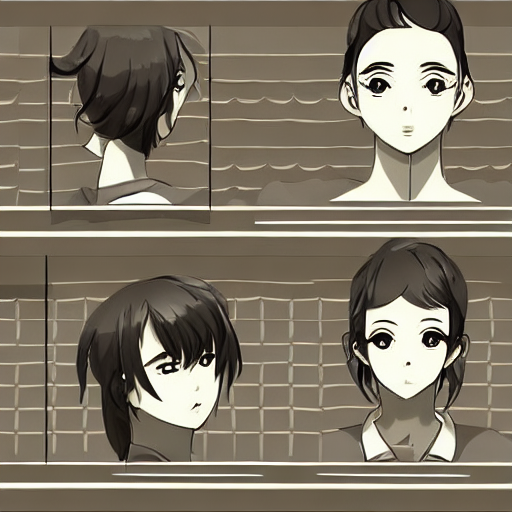

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 7/48] soft_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 8/48] soft_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 9/48] soft_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [10/48] soft_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [11/48] soft_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [12/48] soft_angry_v3.png


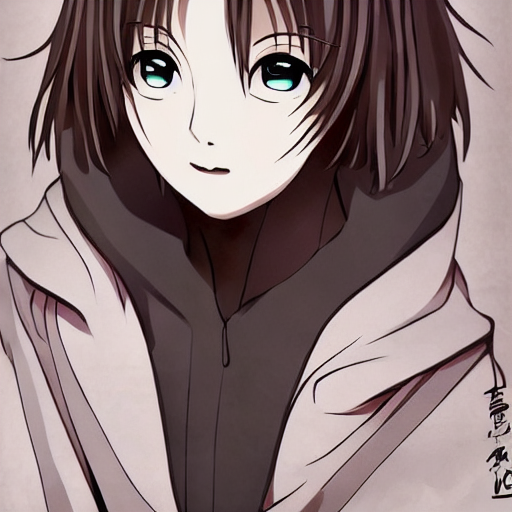


Archetype: STOIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [13/48] stoic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [14/48] stoic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [15/48] stoic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [16/48] stoic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [17/48] stoic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [18/48] stoic_happy_v3.png


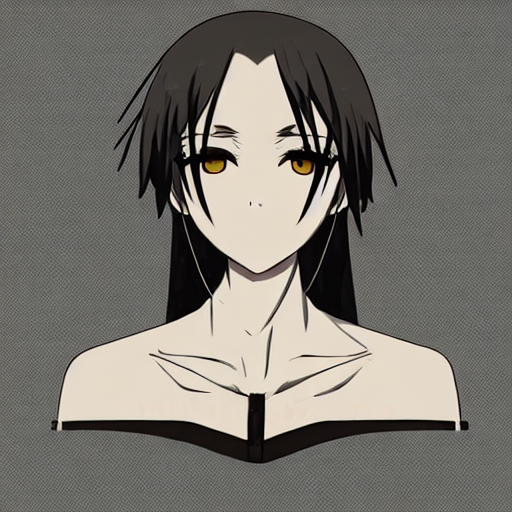

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [19/48] stoic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [20/48] stoic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [21/48] stoic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [22/48] stoic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [23/48] stoic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [24/48] stoic_angry_v3.png


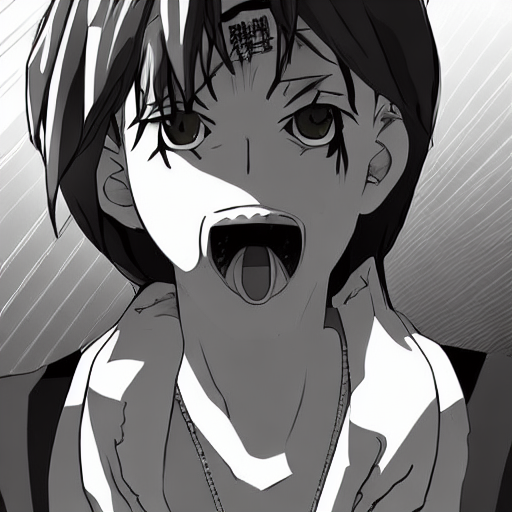


Archetype: ENERGETIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [25/48] energetic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [26/48] energetic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [27/48] energetic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [28/48] energetic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [29/48] energetic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [30/48] energetic_happy_v3.png


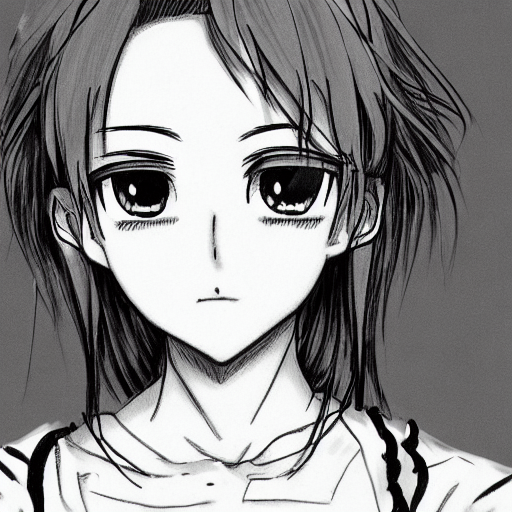

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [31/48] energetic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [32/48] energetic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [33/48] energetic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [34/48] energetic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [35/48] energetic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [36/48] energetic_angry_v3.png


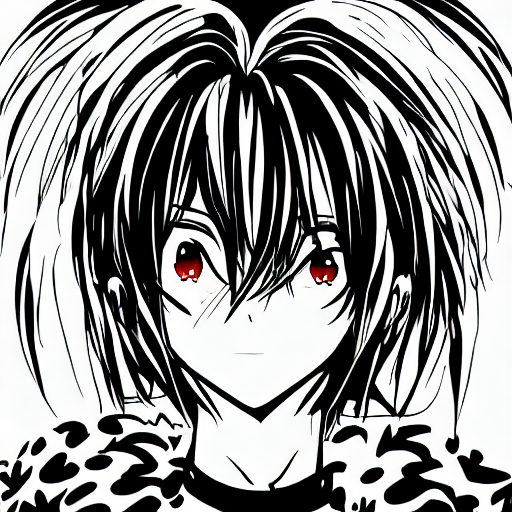


Archetype: MELANCHOLIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [37/48] melancholic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [38/48] melancholic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [39/48] melancholic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [40/48] melancholic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [41/48] melancholic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [42/48] melancholic_happy_v3.png


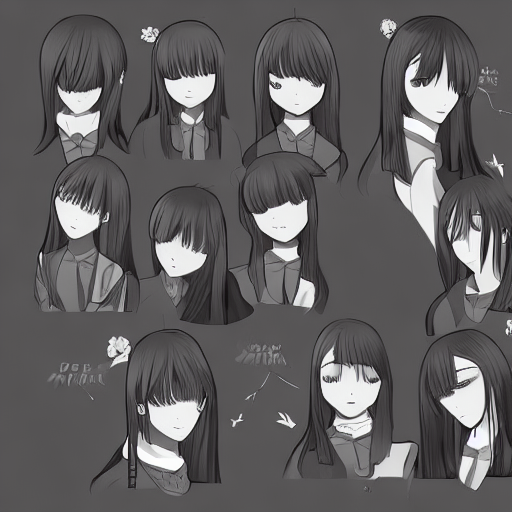

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [43/48] melancholic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [44/48] melancholic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [45/48] melancholic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [46/48] melancholic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [47/48] melancholic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [48/48] melancholic_angry_v3.png


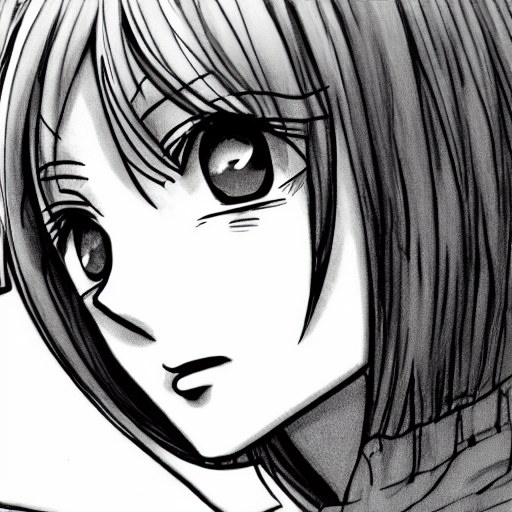


✅ Generation complete! Creating zip file...
📦 ZIP created: test_generation_results.zip
📁 Contains 48 images

File naming pattern: <archetype>_<emotion>_v<1-3>.png
Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.

✅ Download 'test_generation_results.zip' from the Files panel!


In [13]:
# ============================================
# Cell 10: Generate Test Matrix & Save to ZIP
# ============================================

import os
import zipfile
from PIL import Image
import torch
from IPython.display import display

# Define archetypes
archetypes = {
    "soft": "gentle anime character, rounded eyes, relaxed facial tension",
    "stoic": "cool anime character, narrow eyes, restrained expression",
    "energetic": "expressive anime character, wide eyes, dynamic face",
    "melancholic": "sad anime character, drooping eyelids, subtle tension"
}

# Define emotions (only your 4)
emotions = {
    "neutral": "emotionally neutral, balanced facial expression",
    "happy": "soft smile, relaxed eyes, gentle eyebrows",
    "sad": "lowered gaze, softened mouth, subtle sadness",
    "angry": "tight mouth, tense eyes, controlled anger"
}

# Settings
num_variations = 3  # Generate 3 images per combination
output_dir = "test_generation_matrix"
zip_filename = "test_generation_results.zip"

# Create output directory
os.makedirs(output_dir, exist_ok=True)

total_images = len(archetypes) * len(emotions) * num_variations
print(f"🎨 Generating {len(archetypes)} archetypes × {len(emotions)} emotions × {num_variations} variations = {total_images} images...")
print(f"Output directory: {output_dir}\n")

# Generate all combinations
generated_count = 0
for arch_name, arch_desc in archetypes.items():
    print(f"\n{'='*60}")
    print(f"Archetype: {arch_name.upper()}")
    print(f"{'='*60}")

    for emo_name, emo_desc in emotions.items():
        # Combine archetype + emotion descriptions
        full_prompt = f"{arch_desc}, {emo_desc}, anime style, clean line art"

        # Generate multiple variations
        for variation in range(num_variations):
            # Generate image with unique seed
            image = test_pipeline(
                prompt=full_prompt,
                num_inference_steps=30,
                guidance_scale=7.0,
                generator=torch.Generator("cuda").manual_seed(42 + generated_count)
            ).images[0]

            # Save image with variation number
            filename = f"{arch_name}_{emo_name}_v{variation+1}.png"
            filepath = os.path.join(output_dir, filename)
            image.save(filepath)

            generated_count += 1
            print(f"  ✓ [{generated_count:2d}/{total_images}] {filename}")

            # Display every 6th image
            if generated_count % 6 == 0:
                display(image)

print(f"\n{'='*60}")
print(f"✅ Generation complete! Creating zip file...")

# Create zip file
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for filename in os.listdir(output_dir):
        filepath = os.path.join(output_dir, filename)
        zipf.write(filepath, filename)

print(f"📦 ZIP created: {zip_filename}")
print(f"📁 Contains {generated_count} images")
print(f"\nFile naming pattern: <archetype>_<emotion>_v<1-3>.png")
print(f"Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.")
print(f"\n✅ Download '{zip_filename}' from the Files panel!")

In [16]:
import os
import zipfile
from google.colab import files
from tqdm.auto import tqdm

# Create zip file with progress bar
print("📦 Creating zip file...")

zip_path = 'lora_weights_v2.zip'
source_dir = final_path  # or whatever your LoRA weights directory is

# Get total size for progress bar
total_size = 0
file_list = []
for root, dirs, filenames in os.walk(source_dir):
    for filename in filenames:
        filepath = os.path.join(root, filename)
        file_list.append((filepath, os.path.relpath(filepath, source_dir)))
        total_size += os.path.getsize(filepath)

# Create zip with progress
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    with tqdm(total=total_size, unit='B', unit_scale=True, desc='Zipping') as pbar:
        for filepath, arcname in file_list:
            zipf.write(filepath, arcname)
            pbar.update(os.path.getsize(filepath))

zip_size_mb = os.path.getsize(zip_path) / (1024 * 1024)
print(f"\n✅ Zip created! Size: {zip_size_mb:.2f} MB")

# Download with indication
print("\n⬇️ Starting download...")
print("(Check your browser's download bar for progress)")
files.download(zip_path)

print("\n✅ Download initiated! Check your browser's downloads folder.")

📦 Creating zip file...


Zipping:   0%|          | 0.00/51.1M [00:00<?, ?B/s]


✅ Zip created! Size: 45.16 MB

⬇️ Starting download...
(Check your browser's download bar for progress)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download initiated! Check your browser's downloads folder.


In [ ]:

# ============================================
# Cell 8: Save & Download
# ============================================

import shutil

final_path = f"{OUTPUT_DIR}/final_lora_v2"
accelerator.wait_for_everyone()
unwrapped_unet = accelerator.unwrap_model(unet)
unwrapped_unet.save_pretrained(final_path)

print(f"\n✅ Final LoRA saved: {final_path}")

# Create download package
!zip -r lora_weights_v2.zip {OUTPUT_DIR}

print(f"✓ Package size: {os.path.getsize('lora_weights_v2.zip') / 1024 / 1024:.1f} MB")

from google.colab import files
files.download('lora_weights_v2.zip')

print("\n✅ Download started!")

In [17]:
# ============================================
# Cell 8: Save & Download
# ============================================

import shutil
import zipfile
from tqdm.auto import tqdm
from google.colab import files

# Save the model
final_path = f"{OUTPUT_DIR}/final_lora_v2"
print(f"\n💾 Saving LoRA model to {final_path}...")

accelerator.wait_for_everyone()
unwrapped_unet = accelerator.unwrap_model(unet)
unwrapped_unet.save_pretrained(final_path)

print(f"✅ Final LoRA saved: {final_path}")

# List saved files
saved_files = os.listdir(final_path)
print(f"📁 Saved files: {', '.join(saved_files)}")

# Create zip file with progress bar
print("\n📦 Creating zip file...")

zip_path = 'lora_weights_v2.zip'

# Get total size for progress bar
total_size = 0
file_list = []
for root, dirs, filenames in os.walk(final_path):
    for filename in filenames:
        filepath = os.path.join(root, filename)
        file_list.append((filepath, os.path.relpath(filepath, final_path)))
        total_size += os.path.getsize(filepath)

print(f"📊 Total files to zip: {len(file_list)}")
print(f"📊 Total size: {total_size / 1024 / 1024:.2f} MB")

# Create zip with progress
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    with tqdm(total=total_size, unit='B', unit_scale=True, desc='Zipping', ncols=100) as pbar:
        for filepath, arcname in file_list:
            file_size = os.path.getsize(filepath)
            zipf.write(filepath, arcname)
            pbar.update(file_size)

# Show final zip info
zip_size_mb = os.path.getsize(zip_path) / (1024 * 1024)
compression_ratio = (1 - os.path.getsize(zip_path) / total_size) * 100

print(f"\n✅ Zip created successfully!")
print(f"📦 Package size: {zip_size_mb:.2f} MB")
print(f"🗜️  Compression: {compression_ratio:.1f}%")

# Download
print("\n⬇️  Downloading to your computer...")
print("👀 Watch your browser's download bar for progress")

files.download(zip_path)

print("\n✅ Download initiated! Check your browser's Downloads folder.")
print(f"📥 File: lora_weights_v2.zip ({zip_size_mb:.2f} MB)")


💾 Saving LoRA model to lora_output_v2/final_lora_v2...
✅ Final LoRA saved: lora_output_v2/final_lora_v2
📁 Saved files: adapter_config.json, README.md, adapter_model.safetensors

📦 Creating zip file...
📊 Total files to zip: 3
📊 Total size: 48.70 MB


Zipping:   0%|                                                          | 0.00/51.1M [00:00<?, ?B/s]


✅ Zip created successfully!
📦 Package size: 45.16 MB
🗜️  Compression: 7.3%

⬇️  Downloading to your computer...
👀 Watch your browser's download bar for progress


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download initiated! Check your browser's Downloads folder.
📥 File: lora_weights_v2.zip (45.16 MB)


🎨 Generating 4 archetypes × 4 emotions × 3 variations = 48 images...
📁 Output directory: test_generation_matrix



Generating images:   0%|                                                    | 0/48 [00:00<?, ?img/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

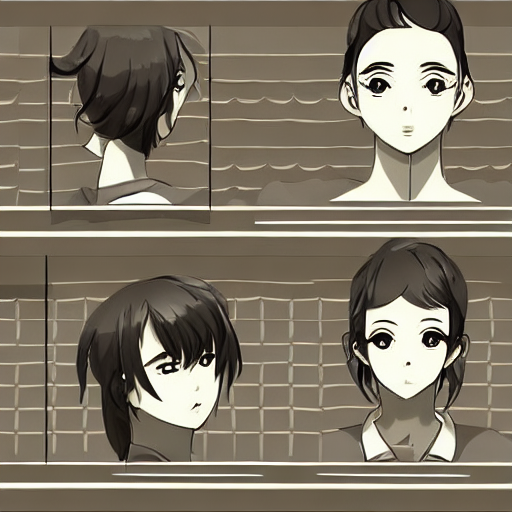

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

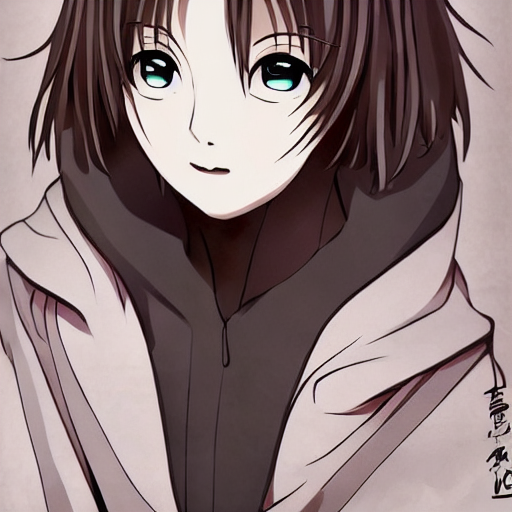

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

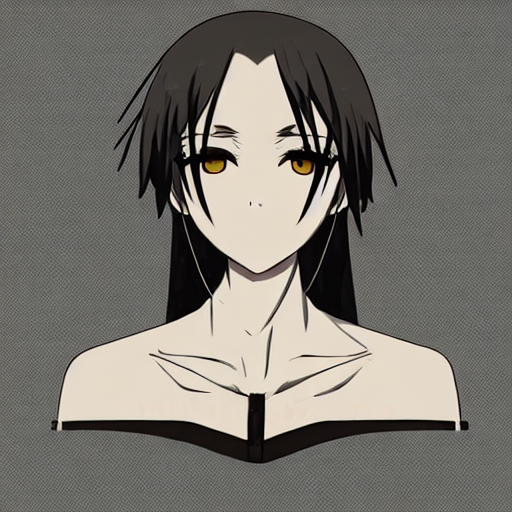

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

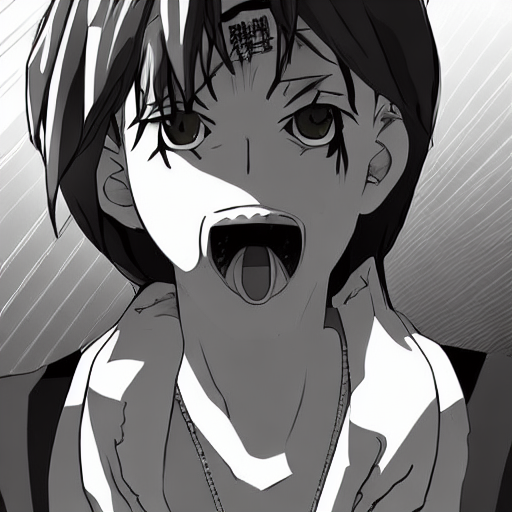

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

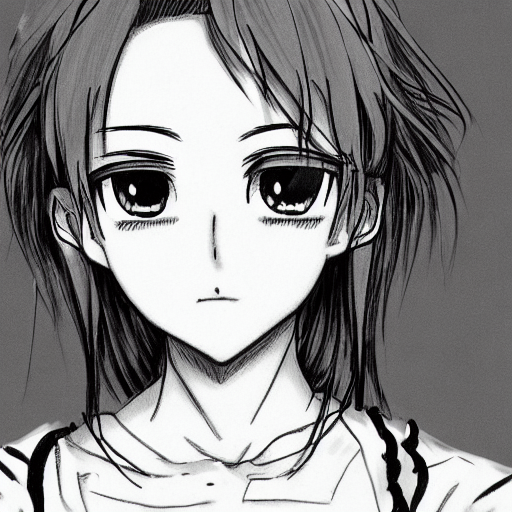

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

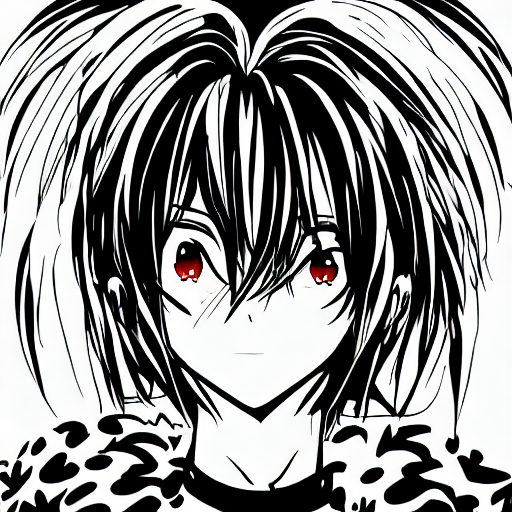

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

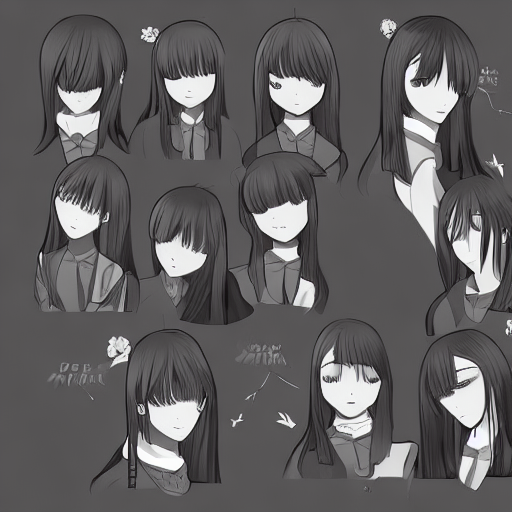

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

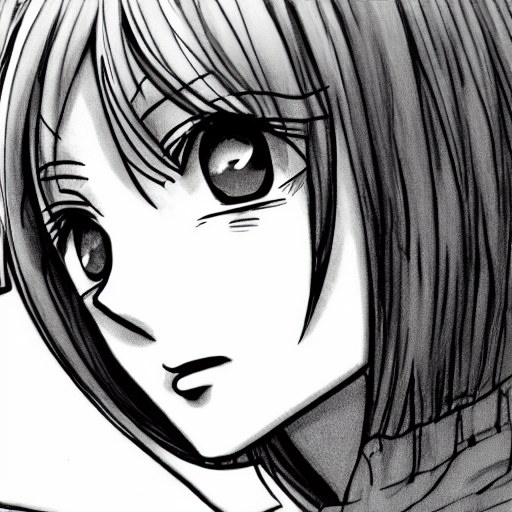


✅ All 48 images generated!

📦 Creating ZIP file...


Zipping:   0%|                                                          | 0.00/20.3M [00:00<?, ?B/s]


✅ ZIP created successfully!
📦 Package size: 19.39 MB
🗜️  Compression: -0.0%
📁 Contains 48 images

📋 File naming pattern: <archetype>_<emotion>_v<1-3>.png
   Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.

⬇️  Downloading test_generation_results.zip to your computer...
👀 Watch your browser's download bar for progress


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download initiated! Check your browser's Downloads folder.
📥 File: test_generation_results.zip (19.39 MB)


In [18]:
# ============================================
# Cell 10: Generate Test Matrix & Save to ZIP
# ============================================

import os
import zipfile
from PIL import Image
import torch
from IPython.display import display
from tqdm.auto import tqdm
from google.colab import files

# Define archetypes
archetypes = {
    "soft": "gentle anime character, rounded eyes, relaxed facial tension",
    "stoic": "cool anime character, narrow eyes, restrained expression",
    "energetic": "expressive anime character, wide eyes, dynamic face",
    "melancholic": "sad anime character, drooping eyelids, subtle tension"
}

# Define emotions (only your 4)
emotions = {
    "neutral": "emotionally neutral, balanced facial expression",
    "happy": "soft smile, relaxed eyes, gentle eyebrows",
    "sad": "lowered gaze, softened mouth, subtle sadness",
    "angry": "tight mouth, tense eyes, controlled anger"
}

# Settings
num_variations = 3  # Generate 3 images per combination
output_dir = "test_generation_matrix"
zip_filename = "test_generation_results.zip"

# Create output directory
os.makedirs(output_dir, exist_ok=True)

total_images = len(archetypes) * len(emotions) * num_variations
print(f"Generating {len(archetypes)} archetypes × {len(emotions)} emotions × {num_variations} variations = {total_images} images...")
print(f"Output directory: {output_dir}\n")

# Generate all combinations with progress bar
generated_count = 0

with tqdm(total=total_images, desc="Generating images", unit="img", ncols=100) as pbar:
    for arch_name, arch_desc in archetypes.items():
        for emo_name, emo_desc in emotions.items():
            # Combine archetype + emotion descriptions
            full_prompt = f"{arch_desc}, {emo_desc}, anime style, clean line art"

            # Generate multiple variations
            for variation in range(num_variations):
                # Generate image with unique seed
                image = test_pipeline(
                    prompt=full_prompt,
                    num_inference_steps=30,
                    guidance_scale=7.0,
                    generator=torch.Generator("cuda").manual_seed(42 + generated_count)
                ).images[0]

                # Save image with variation number
                filename = f"{arch_name}_{emo_name}_v{variation+1}.png"
                filepath = os.path.join(output_dir, filename)
                image.save(filepath)

                generated_count += 1
                pbar.set_postfix({"current": f"{arch_name}_{emo_name}_v{variation+1}"})
                pbar.update(1)

                # Display every 6th image
                if generated_count % 6 == 0:
                    display(image)

print(f"\n✅ All {generated_count} images generated!")

# Create zip file with progress
print(f"\n📦 Creating ZIP file...")

file_list = [f for f in os.listdir(output_dir) if f.endswith('.png')]
total_size = sum(os.path.getsize(os.path.join(output_dir, f)) for f in file_list)

with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    with tqdm(total=total_size, unit='B', unit_scale=True, desc='Zipping', ncols=100) as pbar:
        for filename in file_list:
            filepath = os.path.join(output_dir, filename)
            file_size = os.path.getsize(filepath)
            zipf.write(filepath, filename)
            pbar.update(file_size)

# Show zip info
zip_size_mb = os.path.getsize(zip_filename) / (1024 * 1024)
compression_ratio = (1 - os.path.getsize(zip_filename) / total_size) * 100

print(f"\n✅ ZIP created successfully!")
print(f"📦 Package size: {zip_size_mb:.2f} MB")
print(f"🗜️  Compression: {compression_ratio:.1f}%")
print(f"📁 Contains {len(file_list)} images")
print(f"\n📋 File naming pattern: <archetype>_<emotion>_v<1-3>.png")
print(f"   Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.")

# Download automatically
print(f"\n⬇️  Downloading {zip_filename} to your computer...")
print("👀 Watch your browser's download bar for progress")

files.download(zip_filename)

print(f"\n✅ Download initiated! Check your browser's Downloads folder.")
print(f"📥 File: {zip_filename} ({zip_size_mb:.2f} MB)")